In [3]:
%load_ext autoreload
%autoreload 2

import torch
import matplotlib.pyplot as plt
import time
from tqdm import tqdm
import pytz
from datetime import datetime

from vive3D.visualizer import *
from vive3D.eg3d_generator import *
from vive3D.landmark_detector import *
from vive3D.video_tool import *
from vive3D.segmenter import *
from vive3D.inset_pipeline import *
from vive3D.aligner import *
from vive3D.interfaceGAN_editor import *
from vive3D.config import *

#rom optim_utils import tensor_to_image
# pick which GPU to use
device = torch.device('cuda:0')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# STEP (0): LOAD PRE-TRAINED NETWORKS
Load required models and define some relevant methods to use them

In [14]:
source_video_path = f'{config.HOME}/projects/STIT/examples/obama.mp4'
frames_path = f'{config.PROJECT}/frames'
vid = VideoTool(source_video_path, frames_path) #, crop_area=[0, 256, 264, 528]

generator = EG3D_Generator('models/ffhqrebalanced512-128.pkl', device)
generator.set_camera_parameters(focal_length=3.8, cam_pivot=[0, 0.05, 0.2])
segmenter = Segmenter(device=device)
landmark_detector = LandmarkDetector(device=device)
align = Aligner(landmark_detector=landmark_detector, segmenter=segmenter, device=device)
pipeline = Pipeline(generator, segmenter, align, device=device)

here!
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /datawaha/cggroup/fruehsa/conda/EG3D/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth


#### Initialize directories

In [12]:
load_from_savepoint = False

if load_from_savepoint:
    datetime_string = '20230126_1727'
    savepoint_folder = f'{vid.get_video_title()}_{datetime_string}'
    savepoint_path = os.getcwd()+'/savepoints/'+savepoint_folder
else:
    AST = pytz.timezone('Asia/Riyadh')
    now = datetime.now().astimezone(AST)
    datetime_string = now.strftime("%Y%m%d_%H%M")
    
    savepoint_folder = f'{vid.get_video_title()}_{datetime_string}'
    savepoint_path = os.getcwd()+f'/savepoints/{savepoint_folder}'
    os.makedirs(savepoint_path, exist_ok=True)

video_output_path = os.getcwd()+f'/video/{vid.get_video_title()}_{datetime_string}'
os.makedirs(video_output_path, exist_ok=True)

#### View average EG3D person from multiple angles

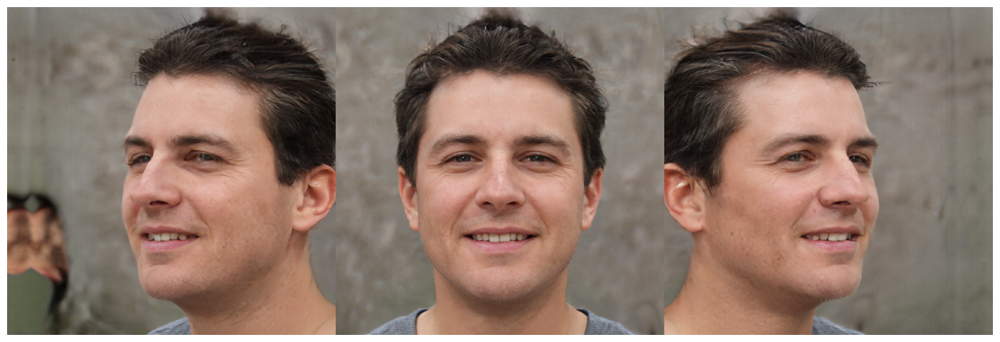

In [15]:
average_face_tensors = generator.generate(generator.get_average_w(), yaw=[0.6, 0.0, -0.6], pitch=[0.0, 0.0, 0.0])

Visualizer.show_tensors(average_face_tensors)

# STEP (1): EXTRACT VIDEO FRAMES
parse video frames and extract cropped face regions from each frame

In [16]:
frames = vid.extract_frames_from_video(3, 10, 0.1)

extracted 70 frames from /datawaha/cggroup/fruehsa/projects/STIT/examples/obama.mp4


In [17]:
face_tensors, segmentation_tensors, foreground_image_tensors, landmarks = align.get_face_tensors_from_frames(frames, reference_face=average_face_tensors[1], return_foreground_images=True)

extracting landmarks...


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 70/70 [00:10<00:00,  6.63it/s]


processing alignment and segmentation...


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 70/70 [00:02<00:00, 34.68it/s]


#### Show faces from all frames

creating grid with 7 x 10 cells for list of len 70


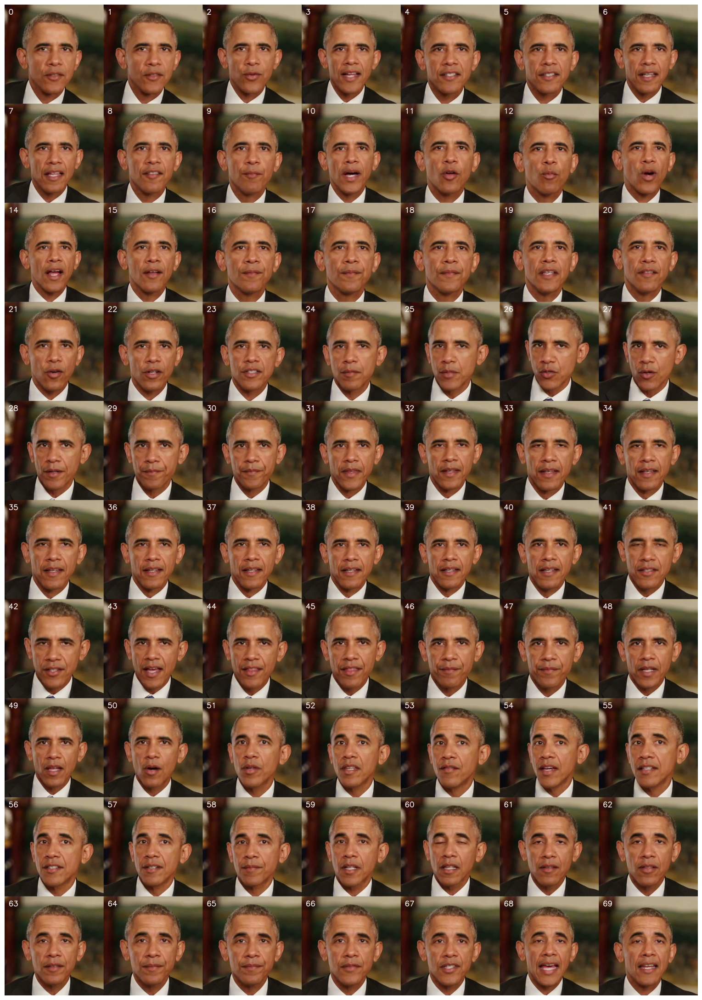

In [18]:
grid = Visualizer.convert_to_grid([tensor_to_image(face_tensor) for face_tensor in face_tensors], grid_width=7, put_indices=True, color='white')
Visualizer.plot(grid)

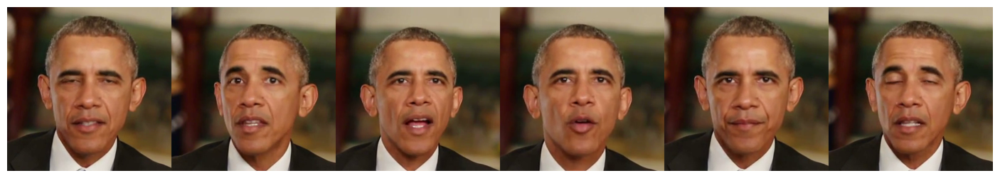

In [19]:
selection = [41, 52, 14, 11, 47, 60]

selected_face_tensors = face_tensors[selection]
selected_segmentation_tensors = segmentation_tensors[selection]

Visualizer.show_tensors(selected_face_tensors, 1, len(selection))

# STEP (2): INVERTING TARGET FRAMES
Optimize a global `w_person` and separate `w_i` offsets for each individual target frame `i` in the EG3D latent space

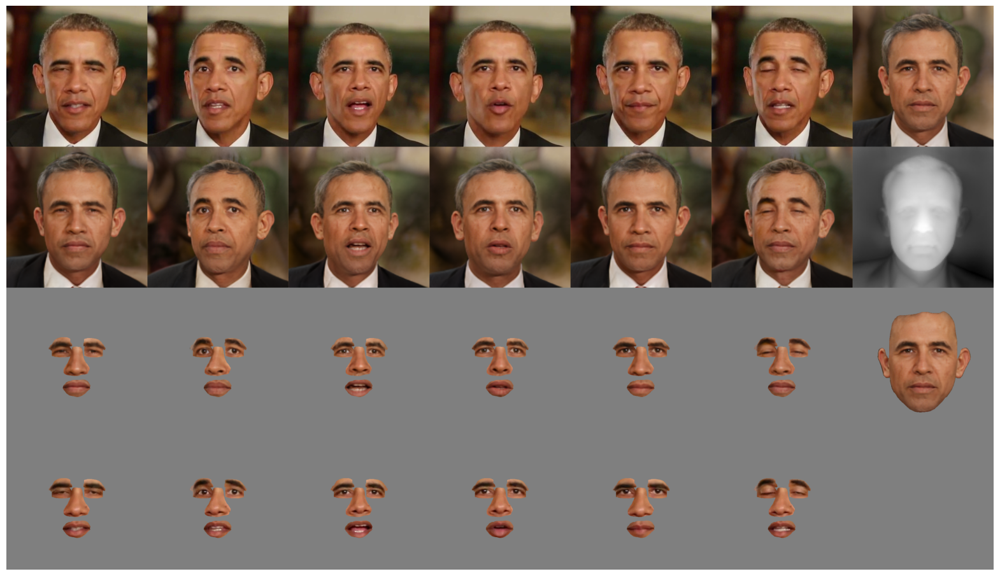

A=[0.03,-0.07|0.19,0.01|-0.09,0.05|-0.06,0.05|0.04,-0.13|0.11,0.00] PX=0.12 LP=0.33 LF=0.17 WD=0.05(x0.005) L=0.67 : 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [04:08<00:00,  2.42it/s]

optimization duration: 00:04:12.


In [20]:
if load_from_savepoint:
    w_person = torch.load(f'{savepoint_path}/inversion_w_person.pt').to(device)
    w_offsets = torch.load(f'{savepoint_path}/inversion_w_offsets.pt').to(device)
    angles = torch.load(f'{savepoint_path}/inversion_angles.pt')
    yaws = angles[:, 0].to(device)
    pitches = angles[:, 1].to(device) 
else:
    weight_vgg = 0.0
    weight_id = 0.0 
    weight_pix = 0.05
    weight_face = 2.0 
    weight_lpips = 1.0
    weight_wdist = 0.05
    weight_wdist_target = 0.005
    initial_learning_rate = 1e-2

    start_time = time.time()
    
    w_person, w_offsets, yaws, pitches = pipeline.inversion(selected_face_tensors, initial_learning_rate=initial_learning_rate, weight_vgg=weight_vgg, weight_id=weight_id, weight_pix=weight_pix, weight_face=weight_face, weight_lpips=weight_lpips, weight_wdist=weight_wdist, weight_wdist_target=weight_wdist_target)
    
    elapsed_time = time.time() - start_time
    print(f'optimization duration: {time.strftime("%H:%M:%S", time.gmtime(elapsed_time))}.')

    torch.save(w_person.cpu(), f'{savepoint_path}/inversion_w_person.pt')
    torch.save(w_offsets.cpu(), f'{savepoint_path}/inversion_w_offsets.pt')
    torch.save(torch.tensor(list(zip(yaws, pitches))).cpu(), f'{savepoint_path}/inversion_angles.pt')

# STEP (3): RUN PIVOTAL TUNING JOINTLY ON ALL FRAMES 
Freeze person latents and optimize parameters of `G` (excepting superresolution module) jointly for all target frames

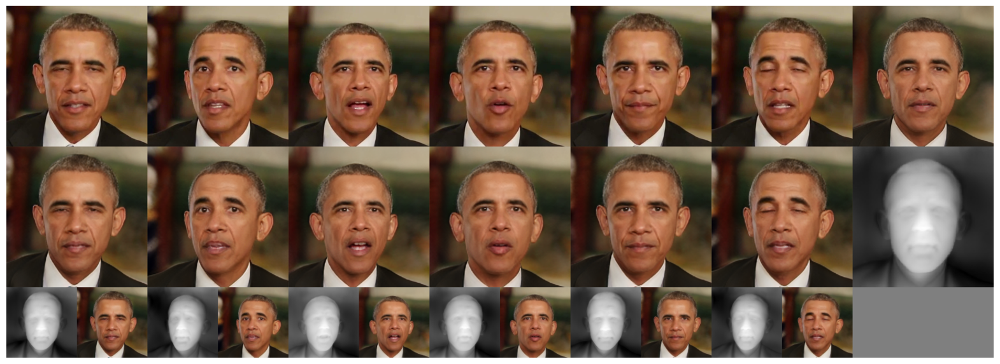

PIX: 0.0485  LPIPS: 0.2089  total: 0.3556: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [06:22<00:00,  1.04it/s]


In [21]:
generator_path = f'{savepoint_path}/G_tune.pkl'

if load_from_savepoint and os.path.exists(generator_path):
    generator.load_tuned(generator_path)
else:
    pipeline.tune(w_person, w_offsets, yaws, pitches, selected_face_tensors) 
    import pickle
    with open(generator_path, 'wb') as f:
        pickle.dump(generator.G_tune.cpu(), f)

creating grid with 5 x 3 cells for list of len 15


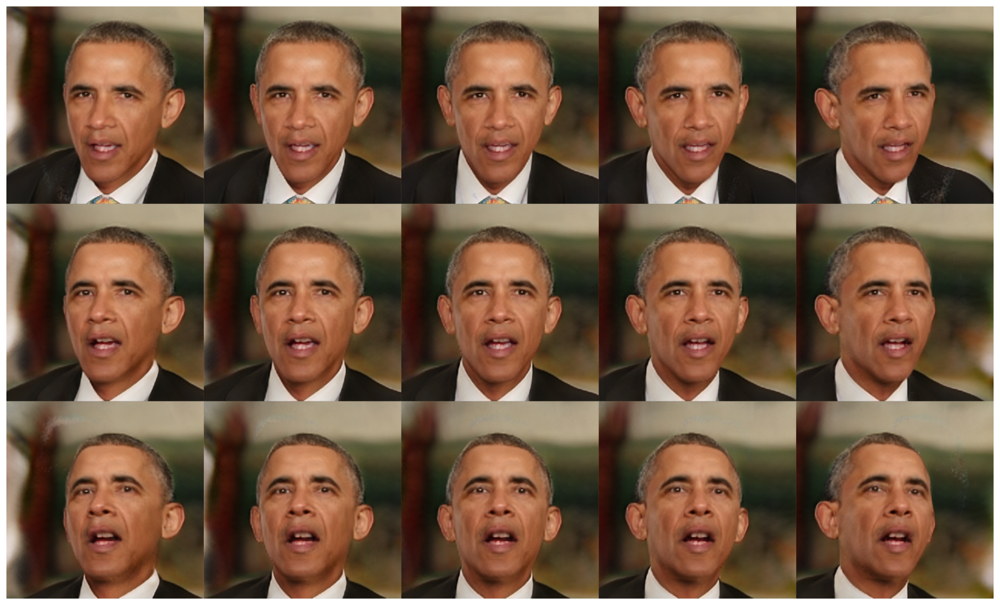

In [22]:
pitch_range = 0.3
yaw_range = 0.25
num_rows = 3
num_cols = 5
angles = np.mgrid[-pitch_range:pitch_range:complex(0,num_rows), yaw_range:-yaw_range:complex(0,num_cols)]

frame_index = 2
output = generator.generate(w_person + w_offsets[frame_index], angles[1].ravel(), angles[0].ravel())

grid = Visualizer.convert_to_grid([tensor_to_image(o) for o in output], grid_width=5)
Visualizer.plot(grid)

# STEP (4): LOAD ALL VIDEO FRAMES AND INVERT

In [23]:
start_sec = 70
end_sec = 85
frames_video = vid.extract_frames_from_video(start_sec, end_sec, resize=3)

reference_neutral_face = generator.generate(w_person, 0.0, -0.1)

face_tensors_video, segmentation_tensors_video, landmarks_video = align.get_face_tensors_from_frames(frames_video, reference_face=reference_neutral_face, smooth_landmarks=True)

if not load_from_savepoint:
    vid.write_frames_to_video(frames_video, f'{video_output_path}/{vid.get_video_title()}_{start_sec}-{end_sec}_source')

extracted 450 frames from /datawaha/cggroup/fruehsa/projects/STIT/examples/obama.mp4
extracting landmarks...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 450/450 [00:31<00:00, 14.15it/s]


smoothing landmarks...
processing alignment and segmentation...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 450/450 [00:17<00:00, 26.26it/s]


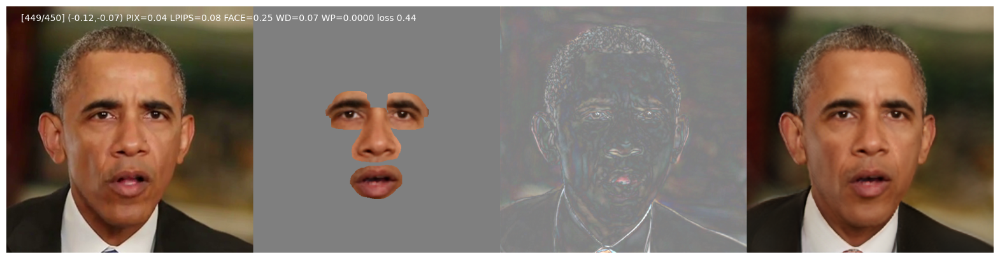

  0%|                                                                                                                                                                                                                                                                                                                                                        | 0/450 [00:00<?, ?it/s]/datawaha/cggroup/fruehsa/projects/VIVE3D/vive3D/inset_pipeline.py:856: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  w_offset_opt = torch.tensor(start_offset, dtype=torch.float32, device=self.device, requires_grad=True)  # pylint: disable=not-callable
[0/450] (0.24,-0.05) PIX=0.04 LPIPS=0.09 FACE=0.18 WD=0.09 WP=0.0000 loss 0.40 :   0%|▌                                                                                                                                       

In [24]:
if load_from_savepoint:
    w_offsets_video = torch.load(f'{savepoint_path}/inversion_video_w_offsets.pt').to(device)
    angles = torch.load(f'{savepoint_path}/inversion_video_angles.pt')
    yaws_video = angles[:, 0].to(device)
    pitches_video = angles[:, 1].to(device) 
else:
    # accumulate segmentation of multiple frames to account for closed eyes (that don't get segmented)
    faces_accum_segmentation = segmenter.get_eyes_mouth_BiSeNet(selected_face_tensors.to(device), dilate=8).any(dim=0)

    # empirically pick a "good enough" loss threshold based on video
    loss_threshold = 0.38
    w_offsets_video, yaws_video, pitches_video = pipeline.inversion_video(w_person, w_offsets, face_tensors_video, face_segmentation=faces_accum_segmentation, loss_threshold=loss_threshold)

    torch.save(w_offsets_video.cpu(), f'{savepoint_path}/inversion_video_w_offsets.pt')
    torch.save(torch.tensor(list(zip(yaws_video, pitches_video))).cpu(), f'{savepoint_path}/inversion_video_angles.pt')

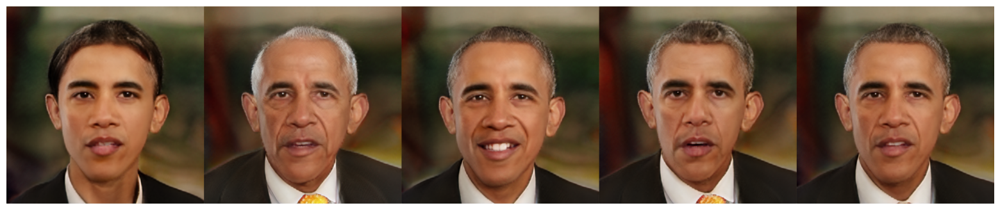

In [25]:
editor = Editor(device=device)
edits = [(1.3, 'young'), (-1.3, 'young'), (1.0, 'smiling'), (-1.2, 'smiling'), (0, 'default')]

frame_index = 0

w_edits = editor.edit_list(w_person, edits, w_offsets_video[frame_index])

images = generator.generate(w_edits, 0.0, -0.1)

Visualizer.show_tensors(images)

processing edit _young+1.3...


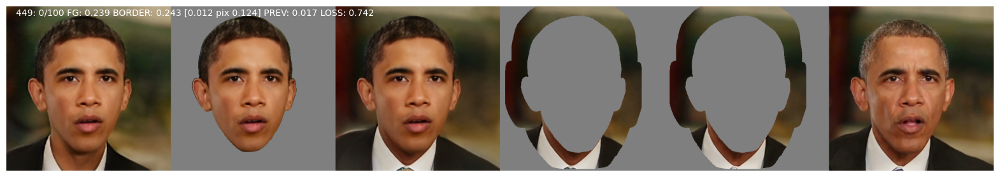

449: 8/100 FG: 0.143 BORDER: 0.158 [0.008 pix 0.083] PREV: 0.003 LOSS: 0.462: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 450/450 [17:24<00:00,  2.32s/it]


processing edit _young-1.3...


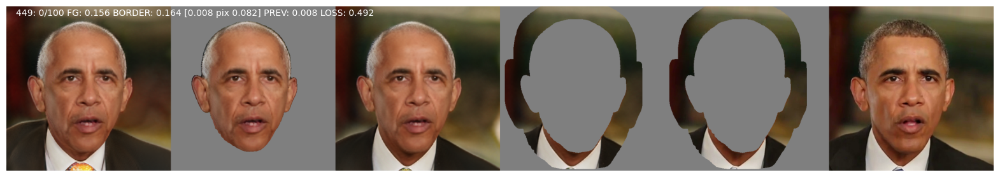

449: 8/100 FG: 0.155 BORDER: 0.157 [0.008 pix 0.078] PREV: 0.003 LOSS: 0.472: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 450/450 [17:02<00:00,  2.27s/it]


processing edit _smiling+1.0...


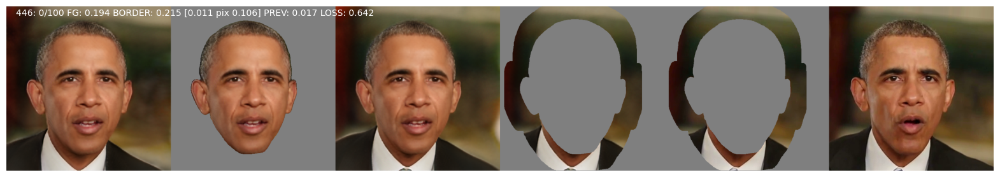

446: 16/100 FG: 0.152 BORDER: 0.159 [0.008 pix 0.081] PREV: 0.003 LOSS: 0.474:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 446/450 [16:37<00:06,  1.64s/it]

In [ ]:
fname_prefix = vid.get_video_title() + '_inset'

reference_neutral_face = generator.generate(w_person, 0.0, -0.1)
reference_face_landmarks = landmark_detector.get_landmarks(tensor_to_image(reference_neutral_face), get_all=False)

video_semantic_edits = [ [ edit ] for edit in edits ] # each individual edit can also be list of simultaneous edits, e.g. younger+smiling

for y in ['o', 0.2, 0.0, -0.2]: #process edits for different yaws
    flow_directions = None #Evaluate flow once per camera setting
    use_video_flow = True
    for edit in video_semantic_edits:
        boundary_str = ''
        for e in edit:
            if e[0] != 0:
                boundary_str += f'_{e[1]}{"+" if e[0]>0 else "-"}{abs(e[0])}'
            
        print(f'processing edit {boundary_str}...')
        w_default = editor.edit(w_person, 'default', 0.0, w_offsets_video)
        w_modify = editor.multi_edit(w_person, edit, w_offsets_video)
        
        if y == 'o':
            use_video_flow = False
            ys = yaws_video
        else:
            ys = y*torch.ones_like(yaws_video).to(device)

        params = dict(edge_size_y_top = 8,
                      border_size = 50,
                      face_dilate = 0,
                      original_yaws_video = yaws_video,
                      original_pitches_video = pitches_video,
                      use_flow = use_video_flow,
                      use_w_dist = True,
                      include_neck = (y!='o' and abs(y)>0.15),
                      flow_directions = flow_directions,
                      border_loss_threshold = 0.16, #pick an appropriate threshold empirically based on video
                      return_flow_directions = use_video_flow,
                      plot_progress = True)
        

        output = pipeline.inset_video(frames_video, face_tensors_video, landmarks_video, reference_face_landmarks, w_modify, w_default, ys, pitches_video, **params)
        output_inset, output_faces, _, _, _ = output
        
        fname = f'{fname_prefix}_{y}{boundary_str}'
        vid.write_frames_to_video(output_inset, f'{video_output_path}/{fname}')